# Importações

In [37]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [38]:
import os
import pickle
models_prefix = './models-persisted'

def persist_instance(variable:any, file_name:str):
    if not os.path.exists(models_prefix): os.makedirs(models_prefix)

    with open(f'{models_prefix}/{file_name}.pkl', 'wb') as file:
        pickle.dump(variable, file)

def load_instance(path:str):
    with open(f'{path}', 'rb') as file:
        return pickle.load(file)

# Leitura dos dados

In [39]:
from essayDataDiggestor import EssayDataDiggestor

data_path = '../data/collected_data'
data_diggestor = EssayDataDiggestor()

not_measured_by_sensor = ['PT100 3 [ºC]', 'PT100 4 [ºC]', 'Vel. do Ar [m/s]']
target_col = 'Umidade Média Produto [%]'

# Reading data from files
df_train = data_diggestor.get_labeled_essays(data_path)
df_real_time = data_diggestor.get_essays(data_path)
df_measures = data_diggestor.get_labeled_essays(data_path, get_measures_flag=True)

# Removing columns not measured by sensors
df_train = df_train.drop(columns=not_measured_by_sensor).reset_index(drop=True)
df_real_time = df_real_time.drop(columns=not_measured_by_sensor).reset_index(drop=True)
df_measures = df_measures.drop(columns=not_measured_by_sensor).reset_index(drop=True)

print('DataFrame de treinamento')
display(df_train.head())
print('\n\nDataFrame com dados em tempo real do ensaio')
display(df_real_time.head())

DataFrame de treinamento


,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio,Umidade Média Produto [%]
0,0.000,23.681101,23.626140,23.174812,57.704340,24.255182,73.746678,0,55.223333
1,899.564,27.150231,27.212689,24.787157,47.790284,28.432172,87.234795,0,48.006667
2,1798.938,26.887455,26.675792,26.097392,44.201039,26.974166,92.332055,0,41.003333
3,2700.298,26.897853,26.742584,27.033274,42.788991,26.882220,93.655657,0,7.083333
4,3601.595,43.864988,39.788933,27.676899,40.073266,36.175378,36.280460,0,2.283333




DataFrame com dados em tempo real do ensaio


,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio
0,0.000,23.681101,23.626140,23.174812,57.704340,24.255182,73.746678,0
1,3.253,23.681888,23.623464,22.944946,57.779871,24.288020,73.914167,0
2,6.655,23.675593,23.618114,23.158393,57.628810,24.333993,74.577554,0
3,9.884,23.666780,23.609773,23.164961,57.326689,24.383250,75.809093,0
4,13.184,23.649784,23.598442,22.987635,56.486007,24.376682,77.267243,0


In [40]:
df_measures = df_measures[
    [
        'Time',
        'Umidade Média Produto [%]',
        'Umidade 0 Produto [%]',
        'Umidade 1 Produto [%]',
        'Umidade 2 Produto [%]',
        'Ensaio'
    ]
]

df_measures.head()

,Time,Umidade Média Produto [%],Umidade 0 Produto [%],Umidade 1 Produto [%],Umidade 2 Produto [%],Ensaio
0,0.000,55.223333,44.55,59.48,61.64,0
1,899.564,48.006667,48.18,48.39,47.45,0
2,1798.938,41.003333,41.39,39.94,41.68,0
3,2700.298,7.083333,7.61,6.74,6.90,0
4,3601.595,2.283333,2.44,2.32,2.09,0


# Criação de dataframes

### Timeless dataframes

In [41]:
df_train_timeless = df_train.copy().drop(columns=['Time'])
df_real_time_timeless = df_real_time.copy().drop(columns=['Time'])
# display(df_train_timeless)
# display(df_real_time_timeless)

### T-1 dataframe

In [42]:
df_train_t1 = pd.DataFrame()
essays = list(df_train['Ensaio'].unique())
for essay in essays:
    mask = (df_train['Ensaio'] == essay)
    df_essay = df_train[mask].copy()
    df_columns = set(list(df_essay.columns))
    columns_to_avoid = set(['Ensaio', 'Umidade Média Produto [%]', 'Time'])

    for col in list(df_columns - columns_to_avoid):
        df_essay[f'{col} t-1'] = df_essay[col].shift()
    
    df_essay.dropna(inplace=True)
    df_essay = df_essay.reset_index(drop=True)
    
    df_train_t1 = pd.concat([df_train_t1, df_essay])

display(df_train_t1)

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio,Umidade Média Produto [%],Temp. TH 1 [ºC] t-1,Umidade 2 [%] t-1,PT100 1 [ºC] t-1,Temp. TH 2 [ºC] t-1,Umidade 1 [%] t-1,PT100 2 [ºC] t-1
0,899.564,27.150231,27.212689,24.787157,47.790284,28.432172,87.234795,0,48.006667,23.174812,73.746678,23.681101,24.255182,57.704340,23.626140
1,1798.938,26.887455,26.675792,26.097392,44.201039,26.974166,92.332055,0,41.003333,24.787157,87.234795,27.150231,28.432172,47.790284,27.212689
2,2700.298,26.897853,26.742584,27.033274,42.788991,26.882220,93.655657,0,7.083333,26.097392,92.332055,26.887455,26.974166,44.201039,26.675792
3,3601.595,43.864988,39.788933,27.676899,40.073266,36.175378,36.280460,0,2.283333,27.033274,93.655657,26.897853,26.882220,42.788991,26.742584
0,898.476,26.933613,26.909098,27.158059,44.335677,27.230302,91.898520,1,51.775000,25.890513,68.761479,26.356301,26.698327,49.829562,26.398715
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,3600.926,47.326612,45.270043,30.878602,38.506885,42.030426,20.620015,15,2.446667,31.121603,63.993106,34.832114,30.986968,39.735033,33.084378
0,901.487,25.951064,25.942748,31.358037,25.617958,26.409353,89.323605,16,47.770000,28.793390,80.810847,28.077682,26.369947,31.538646,26.671381
1,1799.483,25.783189,25.708255,32.865302,22.396552,26.136798,90.857383,16,29.630000,31.358037,89.323605,25.951064,26.409353,25.617958,25.942748
2,2699.369,47.480266,40.944234,33.676401,20.774354,32.609165,41.862951,16,2.153333,32.865302,90.857383,25.783189,26.136798,22.396552,25.708255


In [43]:
df_real_time_t1 = pd.DataFrame()
essays = list(df_real_time['Ensaio'].unique())
for essay in essays:
    mask = (df_real_time['Ensaio'] == essay)
    df_essay = df_real_time[mask].copy()
    df_columns = set(list(df_essay.columns))
    columns_to_avoid = set(['Ensaio', 'Time'])

    for col in list(df_columns - columns_to_avoid):
        df_essay[f'{col} t-1'] = df_essay[col].shift()
    
    df_essay.dropna(inplace=True)
    df_essay = df_essay.reset_index(drop=True)
    
    df_real_time_t1 = pd.concat([df_train_t2, df_essay])

display(df_real_time_t1)

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio,Umidade Média Produto [%],Temp. TH 1 [ºC] t-1,...,Umidade 2 [%] t-1,Umidade 2 [%] t-2,PT100 1 [ºC] t-1,PT100 1 [ºC] t-2,Temp. TH 2 [ºC] t-1,Temp. TH 2 [ºC] t-2,Umidade 1 [%] t-1,Umidade 1 [%] t-2,PT100 2 [ºC] t-1,PT100 2 [ºC] t-2
0,1798.938,26.887455,26.675792,26.097392,44.201039,26.974166,92.332055,0,41.003333,24.787157,...,87.234795,73.746678,27.150231,23.681101,28.432172,24.255182,47.790284,57.704340,27.212689,23.626140
1,2700.298,26.897853,26.742584,27.033274,42.788991,26.882220,93.655657,0,7.083333,26.097392,...,92.332055,87.234795,26.887455,27.150231,26.974166,28.432172,44.201039,47.790284,26.675792,27.212689
2,3601.595,43.864988,39.788933,27.676899,40.073266,36.175378,36.280460,0,2.283333,27.033274,...,93.655657,92.332055,26.897853,26.887455,26.882220,26.974166,42.788991,44.201039,26.742584,26.675792
0,1801.147,26.884620,26.862624,28.579943,40.601962,27.072680,92.834563,1,35.256667,27.158059,...,91.898520,68.761479,26.933613,26.356301,27.230302,26.698327,44.335677,49.829562,26.909098,26.398715
1,2701.283,30.078009,28.687580,29.167743,38.766306,26.816544,93.057900,1,4.863333,28.579943,...,92.834563,91.898520,26.884620,26.933613,27.072680,27.230302,40.601962,44.335677,26.862624,26.909098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1074,3797.793,47.793464,46.637268,33.187114,21.204532,47.034997,8.322117,16,NaN,33.101736,...,8.420633,NaN,47.793147,NaN,47.034997,NaN,21.273492,NaN,46.633939,NaN
1075,3801.274,47.796319,46.640280,33.196966,21.257073,47.031714,8.745733,16,NaN,33.187114,...,8.322117,NaN,47.793464,NaN,47.034997,NaN,21.204532,NaN,46.637268,NaN
1076,3804.877,47.802980,46.640597,33.147709,21.293195,46.956185,8.322117,16,NaN,33.196966,...,8.745733,NaN,47.796319,NaN,47.031714,NaN,21.257073,NaN,46.640280,NaN
1077,3808.446,47.812495,46.641231,33.187114,21.102734,46.992307,8.417349,16,NaN,33.147709,...,8.322117,NaN,47.802980,NaN,46.956185,NaN,21.293195,NaN,46.640597,NaN


### T-2 dataframe

In [33]:
df_train_t2 = pd.DataFrame()
essays = list(df_train['Ensaio'].unique())
for essay in essays:
    mask = (df_train['Ensaio'] == essay)
    df_essay = df_train[mask].copy()
    df_columns = set(list(df_essay.columns))
    columns_to_avoid = set(['Ensaio', 'Umidade Média Produto [%]', 'Time'])

    for col in list(df_columns - columns_to_avoid):
        df_essay[f'{col} t-1'] = df_essay[col].shift()
        df_essay[f'{col} t-2'] = df_essay[col].shift().shift()
    
    df_essay.dropna(inplace=True)
    df_essay = df_essay.reset_index(drop=True)
    
    df_train_t2 = pd.concat([df_train_t2, df_essay])

display(df_train_t2)

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio,Umidade Média Produto [%],Temp. TH 1 [ºC] t-1,...,Umidade 2 [%] t-1,Umidade 2 [%] t-2,PT100 1 [ºC] t-1,PT100 1 [ºC] t-2,Temp. TH 2 [ºC] t-1,Temp. TH 2 [ºC] t-2,Umidade 1 [%] t-1,Umidade 1 [%] t-2,PT100 2 [ºC] t-1,PT100 2 [ºC] t-2
0,1798.938,26.887455,26.675792,26.097392,44.201039,26.974166,92.332055,0,41.003333,24.787157,...,87.234795,73.746678,27.150231,23.681101,28.432172,24.255182,47.790284,57.704340,27.212689,23.626140
1,2700.298,26.897853,26.742584,27.033274,42.788991,26.882220,93.655657,0,7.083333,26.097392,...,92.332055,87.234795,26.887455,27.150231,26.974166,28.432172,44.201039,47.790284,26.675792,27.212689
2,3601.595,43.864988,39.788933,27.676899,40.073266,36.175378,36.280460,0,2.283333,27.033274,...,93.655657,92.332055,26.897853,26.887455,26.882220,26.974166,42.788991,44.201039,26.742584,26.675792
0,1801.147,26.884620,26.862624,28.579943,40.601962,27.072680,92.834563,1,35.256667,27.158059,...,91.898520,68.761479,26.933613,26.356301,27.230302,26.698327,44.335677,49.829562,26.909098,26.398715
1,2701.283,30.078009,28.687580,29.167743,38.766306,26.816544,93.057900,1,4.863333,28.579943,...,92.834563,91.898520,26.884620,26.933613,27.072680,27.230302,40.601962,44.335677,26.862624,26.909098
2,3600.386,47.169319,46.821808,29.404176,37.866541,43.074684,18.242541,1,2.130000,29.167743,...,93.057900,92.834563,30.078009,26.884620,26.816544,27.072680,38.766306,40.601962,28.687580,26.862624
0,1799.430,29.030000,28.909212,27.164626,61.461167,28.960864,93.543988,2,29.313333,25.614674,...,92.561961,91.110277,28.360258,26.392370,28.379631,26.501299,61.700896,66.728672,28.339872,27.002362
1,2699.007,29.381084,29.109735,27.772129,58.689519,28.973999,93.859289,2,7.933333,27.164626,...,93.543988,92.561961,29.030000,28.360258,28.960864,28.379631,61.461167,61.700896,28.909212,28.339872
2,3599.156,44.898335,40.213538,27.768845,57.763451,35.177100,46.112236,2,2.826667,27.772129,...,93.859289,93.543988,29.381084,29.030000,28.973999,28.960864,58.689519,61.461167,29.109735,28.909212
0,1798.958,27.332832,27.265470,26.573543,46.650787,27.348519,92.722895,3,33.850000,25.381524,...,91.662047,89.533801,27.138257,26.188719,27.325532,26.343677,50.729342,56.929335,27.109493,26.384854


In [35]:
df_real_time_t2 = pd.DataFrame()
essays = list(df_real_time['Ensaio'].unique())
for essay in essays:
    mask = (df_real_time['Ensaio'] == essay)
    df_essay = df_real_time[mask].copy()
    df_columns = set(list(df_essay.columns))
    columns_to_avoid = set(['Ensaio', 'Time'])

    for col in list(df_columns - columns_to_avoid):
        df_essay[f'{col} t-1'] = df_essay[col].shift()
        df_essay[f'{col} t-2'] = df_essay[col].shift().shift()
    
    df_essay.dropna(inplace=True)
    df_essay = df_essay.reset_index(drop=True)
    
    df_real_time_t2 = pd.concat([df_train_t2, df_essay])

display(df_real_time_t2)

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio,Umidade Média Produto [%],Temp. TH 1 [ºC] t-1,...,Umidade 2 [%] t-1,Umidade 2 [%] t-2,PT100 1 [ºC] t-1,PT100 1 [ºC] t-2,Temp. TH 2 [ºC] t-1,Temp. TH 2 [ºC] t-2,Umidade 1 [%] t-1,Umidade 1 [%] t-2,PT100 2 [ºC] t-1,PT100 2 [ºC] t-2
0,1798.938,26.887455,26.675792,26.097392,44.201039,26.974166,92.332055,0,41.003333,24.787157,...,87.234795,73.746678,27.150231,23.681101,28.432172,24.255182,47.790284,57.704340,27.212689,23.626140
1,2700.298,26.897853,26.742584,27.033274,42.788991,26.882220,93.655657,0,7.083333,26.097392,...,92.332055,87.234795,26.887455,27.150231,26.974166,28.432172,44.201039,47.790284,26.675792,27.212689
2,3601.595,43.864988,39.788933,27.676899,40.073266,36.175378,36.280460,0,2.283333,27.033274,...,93.655657,92.332055,26.897853,26.887455,26.882220,26.974166,42.788991,44.201039,26.742584,26.675792
0,1801.147,26.884620,26.862624,28.579943,40.601962,27.072680,92.834563,1,35.256667,27.158059,...,91.898520,68.761479,26.933613,26.356301,27.230302,26.698327,44.335677,49.829562,26.909098,26.398715
1,2701.283,30.078009,28.687580,29.167743,38.766306,26.816544,93.057900,1,4.863333,28.579943,...,92.834563,91.898520,26.884620,26.933613,27.072680,27.230302,40.601962,44.335677,26.862624,26.909098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1073,3797.793,47.793464,46.637268,33.187114,21.204532,47.034997,8.322117,16,NaN,33.101736,...,8.420633,8.269576,47.793147,47.788707,47.034997,46.897076,21.273492,21.234086,46.633939,46.626170
1074,3801.274,47.796319,46.640280,33.196966,21.257073,47.031714,8.745733,16,NaN,33.187114,...,8.322117,8.420633,47.793464,47.793147,47.034997,47.034997,21.204532,21.273492,46.637268,46.633939
1075,3804.877,47.802980,46.640597,33.147709,21.293195,46.956185,8.322117,16,NaN,33.196966,...,8.745733,8.322117,47.796319,47.793464,47.031714,47.034997,21.257073,21.204532,46.640280,46.637268
1076,3808.446,47.812495,46.641231,33.187114,21.102734,46.992307,8.417349,16,NaN,33.147709,...,8.322117,8.745733,47.802980,47.796319,46.956185,47.031714,21.293195,21.257073,46.640597,46.640280


## Visualização dos dados

In [146]:
list(df_real_time.columns)

['Time',
 'PT100 1 [ºC]',
 'PT100 2 [ºC]',
 'Temp. TH 1 [ºC]',
 'Umidade 1 [%]',
 'Temp. TH 2 [ºC]',
 'Umidade 2 [%]',
 'Ensaio']

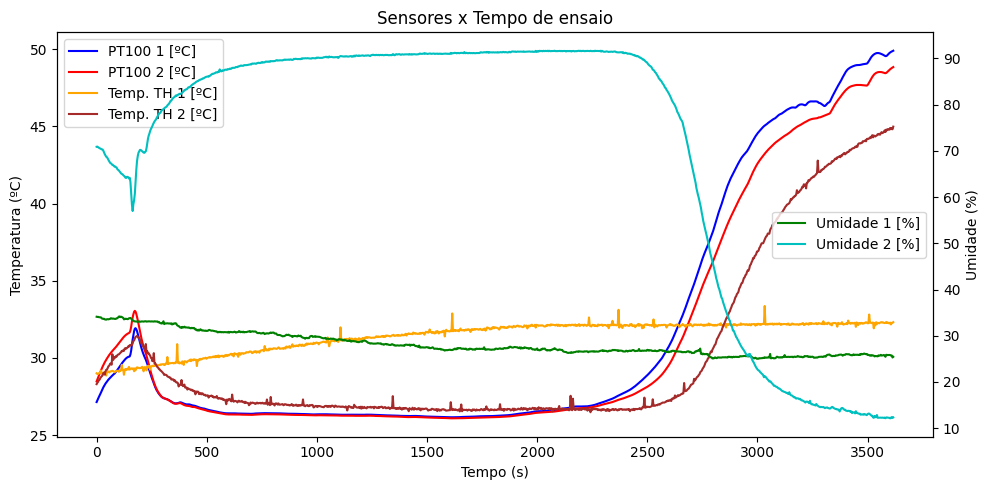

In [147]:
# Graphic of real time data variables per time in a test
essay_number = 5
mask = ( df_real_time['Ensaio'] == essay_number )
df_test = df_real_time[mask]
df_columns = df_real_time.drop(columns=['Time', 'Ensaio']).columns

fig, ax1 = plt.subplots(figsize=(10, 5))
ax2 = ax1.twinx()

trigger = False
color = ['b', 'r', 'orange', 'green', 'brown', 'c']

for i, column in enumerate(df_columns):
    if ('ºC' in column):
        ax1.plot(df_test.Time, df_test[column], label=column, color=color[i])
    elif('%' in column):
        ax2.plot(df_test.Time, df_test[column], label=column, color=color[i])

ax1.set_xlabel('Tempo (s)')
ax1.set_ylabel('Temperatura (ºC)')
ax2.set_ylabel('Umidade (%)')

# ax1.set_yticks(np.linspace(10, 90, 9))

ax1.legend(loc='upper left')
ax2.legend(loc='center right')
plt.title("Sensores x Tempo de ensaio")
plt.tight_layout()
plt.show()

In [148]:
df_test.head()

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Ensaio
5790,0.000,27.143456,28.480464,29.006837,34.106580,28.304104,70.879686,5
5791,3.277,27.252007,28.604511,28.960864,34.054039,28.389483,70.919094,5
5792,6.730,27.364658,28.732819,28.960864,34.093444,28.455159,70.787732,5
5793,10.038,27.465968,28.852148,28.993702,34.017917,28.560240,70.662938,5
5794,13.385,27.563185,28.969746,29.049526,34.001498,28.589794,70.580837,5


In [149]:
df_measures

,Time,Umidade Média Produto [%],Umidade 0 Produto [%],Umidade 1 Produto [%],Umidade 2 Produto [%],Ensaio
0,0.000,55.223333,44.55,59.48,61.64,0
1,899.564,48.006667,48.18,48.39,47.45,0
2,1798.938,41.003333,41.39,39.94,41.68,0
3,2700.298,7.083333,7.61,6.74,6.90,0
4,3601.595,2.283333,2.44,2.32,2.09,0
...,...,...,...,...,...,...
80,0.000,60.726667,60.50,61.35,60.33,16
81,901.487,47.770000,47.57,47.79,47.95,16
82,1799.483,29.630000,29.62,29.67,29.60,16
83,2699.369,2.153333,2.06,2.18,2.22,16


,Time,Umidade Média Produto [%],Umidade 0 Produto [%],Umidade 1 Produto [%],Umidade 2 Produto [%],Ensaio,Error
0,0.000,59.280000,59.68,59.27,58.89,5,0.79
1,898.795,47.513333,47.50,47.35,47.69,5,0.34
2,1800.115,30.583333,30.73,30.63,30.39,5,0.34
3,2698.281,5.256667,5.23,5.22,5.32,5,0.10
4,3598.803,2.146667,2.22,2.24,1.98,5,0.26


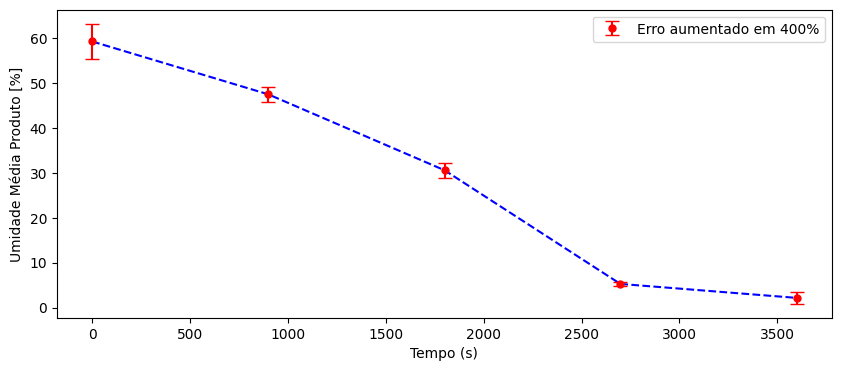

In [150]:
#Graphic of humidity per time in a test
mask = ( df_measures['Ensaio'] == essay_number )
df_test = df_measures[mask].reset_index(drop=True)
df_test['Error'] = df_test[
    ['Umidade 0 Produto [%]', 'Umidade 1 Produto [%]', 'Umidade 2 Produto [%]']
].apply(lambda row : row.max() - row.min(), axis=1)

display(df_test)

error_factor = 5

plt.figure(figsize=(10, 4))
plt.plot(df_test.Time, df_test[target_col], '--b')
plt.errorbar(df_test.Time,
             df_test[target_col],
             yerr=df_test.Error*error_factor,
             fmt='o', color='r', label=f'Erro aumentado em {(error_factor-1)*100}%',
             markersize=5, capsize=5)
plt.xlabel('Tempo (s)')
plt.ylabel(target_col)

plt.legend()
plt.show()

# Normalização dos dados

### Dataframe normal

In [151]:
from sklearn.preprocessing import StandardScaler

columns_to_avoid = ['Ensaio']
scaler = StandardScaler()
scaler.fit(df_train.drop(columns=target_col))

df_scaled = scaler.transform(df_train.drop(columns=target_col))
df_scaled = pd.DataFrame(df_scaled, columns=df_train.drop(columns=target_col).columns)

df_scaled = pd.concat([df_scaled, df_train[[target_col]]], axis=1).drop(columns=columns_to_avoid)

df_train_norm = df_scaled.copy()
df_train_norm.head()

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%],Umidade Média Produto [%]
0,-1.414184,-1.073482,-1.118343,-1.179055,0.752352,-1.058263,0.003619,55.223333
1,-0.707457,-0.655458,-0.632846,-0.737353,-0.007215,-0.356589,0.488132,48.006667
2,-0.000880,-0.687122,-0.705524,-0.378413,-0.282206,-0.601513,0.671234,41.003333
3,0.707258,-0.685869,-0.696482,-0.122028,-0.390390,-0.616958,0.718780,7.083333
4,1.415346,1.358640,1.069553,0.054293,-0.598456,0.944158,-1.342225,2.283333


In [152]:
del(df_scaled)
df_scaled = scaler.transform(df_real_time)
df_scaled = pd.DataFrame(df_scaled, columns=df_real_time.columns).drop(columns=columns_to_avoid)

df_real_time_norm = df_scaled.copy()
df_real_time_norm.head()

,Time,PT100 1 [ºC],PT100 2 [ºC],Temp. TH 1 [ºC],Umidade 1 [%],Temp. TH 2 [ºC],Umidade 2 [%]
0,-1.414184,-1.073482,-1.118343,-1.179055,0.752352,-1.058263,0.003619
1,-1.411628,-1.073387,-1.118706,-1.242027,0.758139,-1.052747,0.009635
2,-1.408955,-1.074146,-1.119430,-1.183553,0.746565,-1.045024,0.033465
3,-1.406418,-1.075208,-1.120559,-1.181754,0.723418,-1.036749,0.077704
4,-1.403826,-1.077255,-1.122093,-1.230333,0.659009,-1.037853,0.130083


# Treinamento de modelos

### Importação de modelos

In [108]:
# Linear Regression
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import Lars
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import TheilSenRegressor
from sklearn.linear_model import HuberRegressor
from sklearn.linear_model import PoissonRegressor

# Support Vector Machine
from sklearn.svm import SVR
from sklearn.svm import NuSVR

# Nearest Neighbors
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import RadiusNeighborsRegressor

# Gaussian Process Regression
from sklearn.gaussian_process import GaussianProcessRegressor

# Decision Trees
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import ExtraTreeRegressor

# Ensemble Methods
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor

# Neural Network
from sklearn.neural_network import MLPRegressor

### Treinamento

In [109]:
X_train = df_train_norm.drop(columns=[target_col]).reset_index(drop=True)
y_train = df_train_norm[target_col].reset_index(drop=True)

print(f'Utilizando {len(X_train)} amostras de treinamento')

Utilizando 85 amostras de treinamento


### Cross validation

In [110]:
from sklearn.model_selection import cross_val_score
from json import dumps

base_models = [
  LinearRegression(),
  Ridge(max_iter=1000),
  Lasso(max_iter=1000),
  Lars(),
  ElasticNet(max_iter=1000),
  BayesianRidge(),
  SGDRegressor(max_iter=1000),
  TheilSenRegressor(max_iter=1000),
  HuberRegressor(max_iter=1000),
  PoissonRegressor(max_iter=1000),
  SVR(max_iter=1000),
  NuSVR(max_iter=1000),
  KNeighborsRegressor(n_neighbors=5),
  RadiusNeighborsRegressor(radius=5),
  GaussianProcessRegressor(),
  DecisionTreeRegressor(),
  ExtraTreeRegressor(),
  BaggingRegressor(),
  AdaBoostRegressor(),
  ExtraTreesRegressor(),
  RandomForestRegressor(),
  GradientBoostingRegressor(),
  HistGradientBoostingRegressor(),
  MLPRegressor(hidden_layer_sizes=[20, 20, 20],
    activation='tanh',
    max_iter=10000),
]

best_score = 0
best_model = None

results = {}

cv = 17
for estimator in base_models:
  
  model = estimator
  model_name = model.__class__.__name__
  scores = cross_val_score(model, X_train, y_train, cv=cv)

  results[model_name] = f'{scores.mean():.3f} +/- {scores.std():.3f}'

  if scores.mean() > best_score:
    best_score = scores.mean()
    best_model = model

print(f'Best model: {best_model} - score: {best_score}')

Best model: RandomForestRegressor() - score: 0.9820718088854837


In [111]:
sorted_scores = dict(sorted(results.items(), key=lambda item: item[1].split(' ')[0]))
with open('result-cross-validation.json', 'w') as outfile:
    outfile.write(dumps(sorted_scores))

### Modelos interessantes


    "HuberRegressor": "0.518 +/- 1.434",
    "Ridge": "0.647 +/- 0.841",
    "LinearRegression": "0.657 +/- 0.848",
    "BayesianRidge": "0.668 +/- 0.799",
    "TheilSenRegressor": "0.669 +/- 0.862",
    "Lars": "0.703 +/- 0.475",
    "SGDRegressor": "0.710 +/- 0.605",
    "Lasso": "0.771 +/- 0.317"

### Gridsearch nos modelos interessantes

#### Função auxiliar

In [138]:
import matplotlib.pyplot as plt

def plot_essay_predictions(clf):
    plt.figure(figsize=(8,8))
    plt.title("Model's predicted humidity")
    essays = list(df_real_time['Ensaio'].unique())
    for essay in essays:
        df_case = df_real_time[df_real_time['Ensaio'] == essay]
        df_case_scaled = scaler.transform(df_case)
        df_case_norm = pd.DataFrame(df_case_scaled, columns=df_case.columns)
        y_pred = clf.predict(df_case_norm.drop(columns=['Ensaio']))
        plt.plot(df_case['Time'], y_pred, label =f'Ensaio {essay}', linewidth=3)
    
    plt.xlabel('Process time (s)')
    plt.ylabel('Humidy (%)')
    plt.legend()
    plt.tight_layout()
    plt.show()

In [113]:
from sklearn.model_selection import RandomizedSearchCV

def train(base_estimator, param_grid, verbose=True):
    clf = RandomizedSearchCV(base_estimator, param_grid, cv=cv)
    clf.fit(X_train, y_train)

    if (verbose):
        print(f'Best estimator: {clf.best_estimator_}\nScore: {clf.best_score_*100:.2f}%')
        plot_essay_predictions(clf)
        
    return clf

#### Huber Regressor

In [114]:
from sklearn.linear_model import HuberRegressor
HuberRegressor().get_params()

{'alpha': 0.0001,
 'epsilon': 1.35,
 'fit_intercept': True,
 'max_iter': 100,
 'tol': 1e-05,
 'warm_start': False}

Best estimator: HuberRegressor(alpha=0.001, max_iter=1000, warm_start=True)
Score: 96.13%


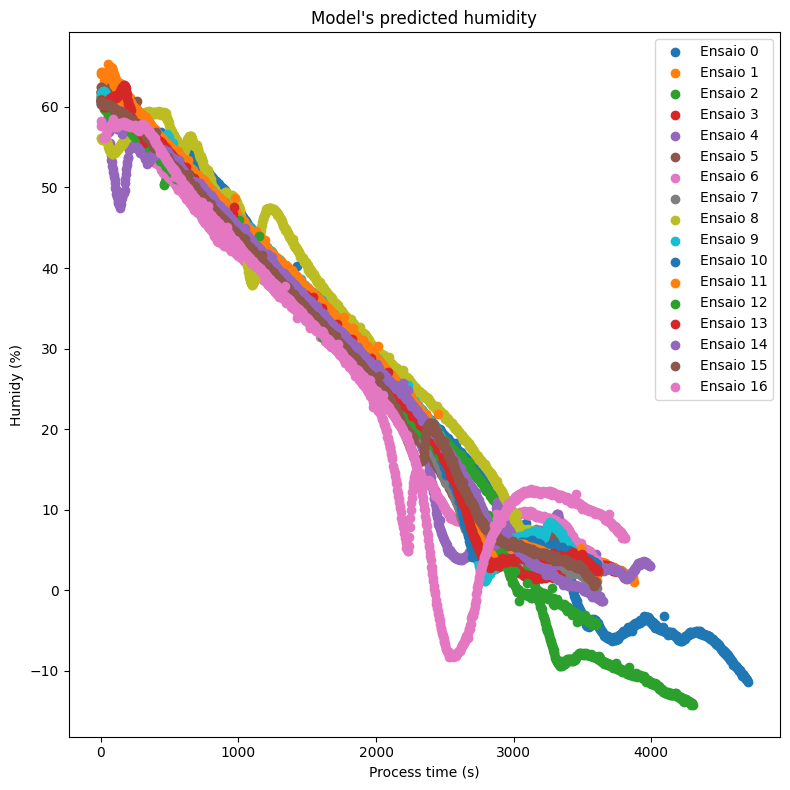

In [116]:
from sklearn.linear_model import HuberRegressor

base_estimator = HuberRegressor(max_iter=1000)
param_grid = {
    'alpha': [0.00001, 0.0001, 0.001],
    'fit_intercept': [True, False],
    'tol': [1e-06, 1e-05, 1e-04],
    'warm_start': [True, False]
}

clf = train(base_estimator, param_grid)
persist_instance(clf, base_estimator.__class__.__name__)

#### Ridge

In [80]:
from sklearn.linear_model import Ridge
Ridge().get_params()

{'alpha': 1.0,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': None,
 'positive': False,
 'random_state': None,
 'solver': 'auto',
 'tol': 0.0001}

Best estimator: Ridge(alpha=0.1, max_iter=1000, random_state=1, tol=0.001)
Score: 68.12%


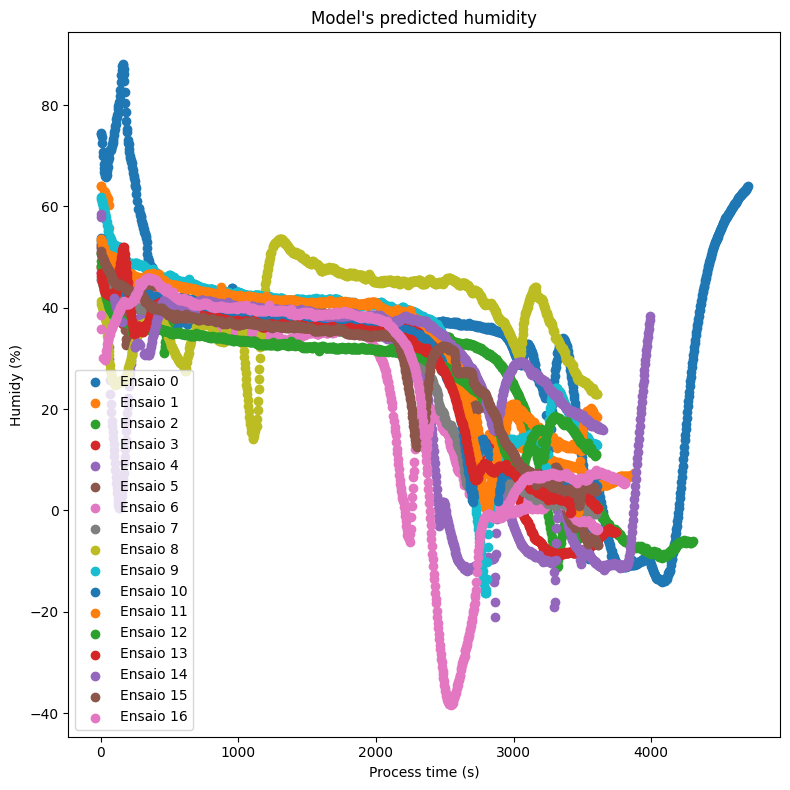

RandomizedSearchCV(cv=17, estimator=Ridge(max_iter=1000, random_state=1),
                   param_distributions={'alpha': [0.1, 1.0, 10],
                                        'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'positive': [True, False],
                                        'tol': [1e-05, 0.0001, 0.001]})

In [81]:
from sklearn.linear_model import Ridge

base_estimator = Ridge(max_iter=1000, random_state=1)
param_grid = {
    'alpha': [0.1, 1.0, 10],
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'positive': [True, False],
    'tol': [0.00001, 0.0001, 0.001]
}

clf = train(base_estimator, param_grid)
persist_instance(clf, base_estimator.__class__.__name__)

#### Linear Regression

In [82]:
from sklearn.linear_model import LinearRegression
LinearRegression().get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

Best estimator: LinearRegression(copy_X=False, n_jobs=True)
Score: 67.46%


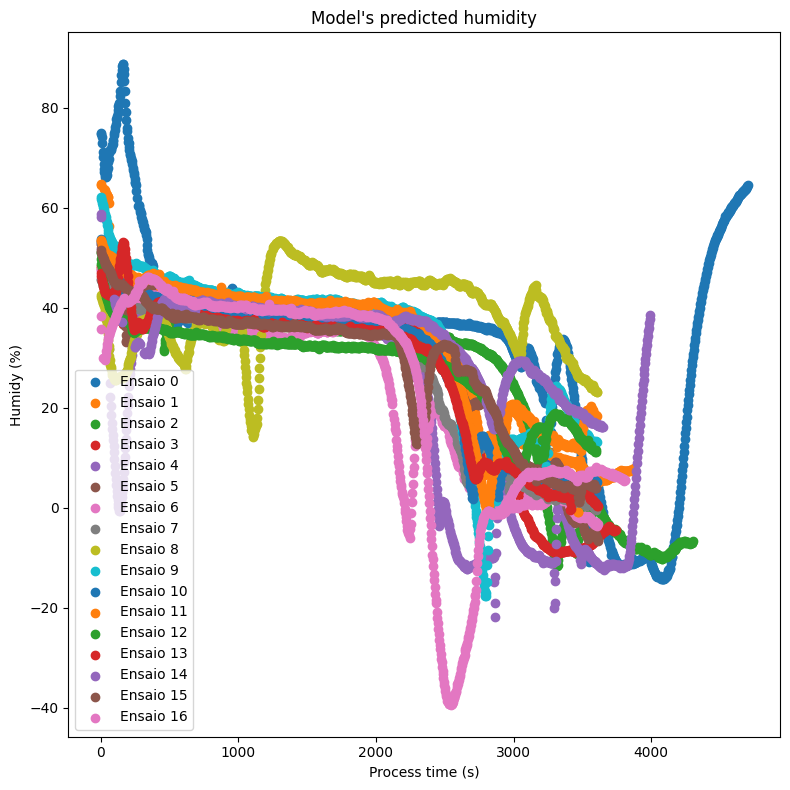

RandomizedSearchCV(cv=17, estimator=LinearRegression(),
                   param_distributions={'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'n_jobs': [None, 2, True],
                                        'positive': [True, False]})

In [83]:
from sklearn.linear_model import LinearRegression

base_estimator = LinearRegression()
param_grid = {
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'n_jobs': [None, 2, True],
    'positive': [True, False]
}

clf = train(base_estimator, param_grid)
persist_instance(clf, base_estimator.__class__.__name__)

#### BayesianRidge

In [84]:
from sklearn.linear_model import BayesianRidge
BayesianRidge().get_params()

{'alpha_1': 1e-06,
 'alpha_2': 1e-06,
 'alpha_init': None,
 'compute_score': False,
 'copy_X': True,
 'fit_intercept': True,
 'lambda_1': 1e-06,
 'lambda_2': 1e-06,
 'lambda_init': None,
 'n_iter': 300,
 'tol': 0.001,
 'verbose': False}

Best estimator: BayesianRidge(alpha_1=1e-07, compute_score=True, copy_X=False, lambda_2=1e-07,
              lambda_init=10, tol=0.01)
Score: 68.63%


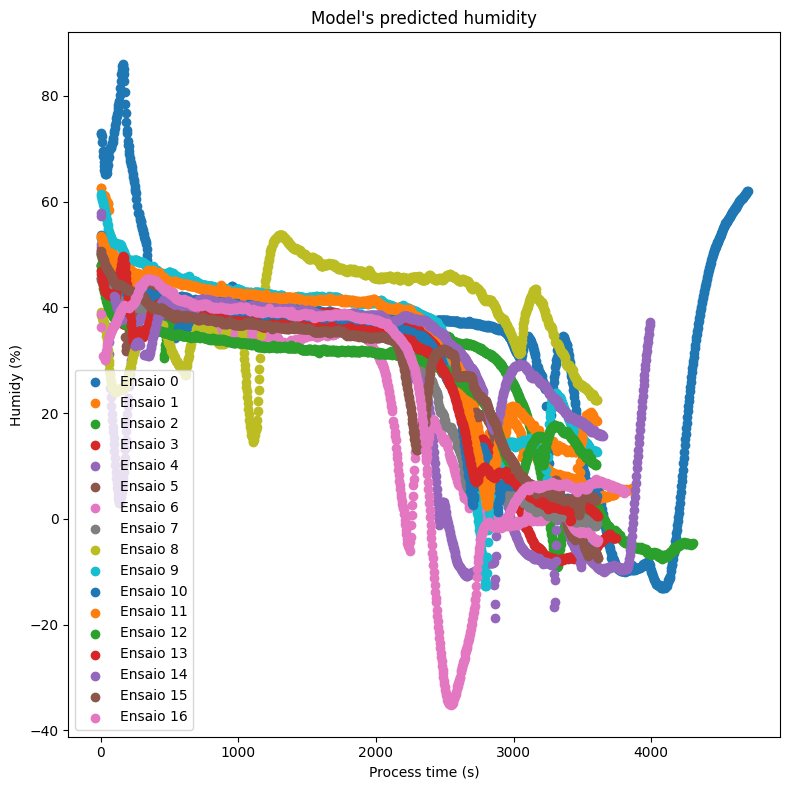

RandomizedSearchCV(cv=17, estimator=BayesianRidge(),
                   param_distributions={'alpha_1': [1e-07, 1e-06, 1e-05],
                                        'alpha_2': [1e-07, 1e-06, 1e-05],
                                        'compute_score': [True, False],
                                        'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'lambda_1': [1e-07, 1e-06, 1e-05],
                                        'lambda_2': [1e-07, 1e-06, 1e-05],
                                        'lambda_init': [0.1, 1, 10],
                                        'tol': [0.0001, 0.001, 0.01]})

In [85]:
from sklearn.linear_model import BayesianRidge

base_estimator = BayesianRidge()
param_grid = {
    'alpha_1': [1e-07, 1e-06, 1e-05],
    'alpha_2': [1e-07, 1e-06, 1e-05],
    'compute_score': [True, False],
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'lambda_1': [1e-07, 1e-06, 1e-05],
    'lambda_2': [1e-07, 1e-06, 1e-05],
    'lambda_init': [0.1, 1, 10],
    'tol': [0.0001, 0.001, 0.01],
}

clf = train(base_estimator, param_grid)
persist_instance(clf, base_estimator.__class__.__name__)

#### TheilSenRegressor

In [86]:
from sklearn.linear_model import TheilSenRegressor
TheilSenRegressor().get_params()

{'copy_X': True,
 'fit_intercept': True,
 'max_iter': 300,
 'max_subpopulation': 10000.0,
 'n_jobs': None,
 'n_subsamples': None,
 'random_state': None,
 'tol': 0.001,
 'verbose': False}

Best estimator: TheilSenRegressor(copy_X=False, max_iter=1000, max_subpopulation=1000.0,
                  n_jobs=-1, random_state=1, tol=0.01)
Score: 55.49%


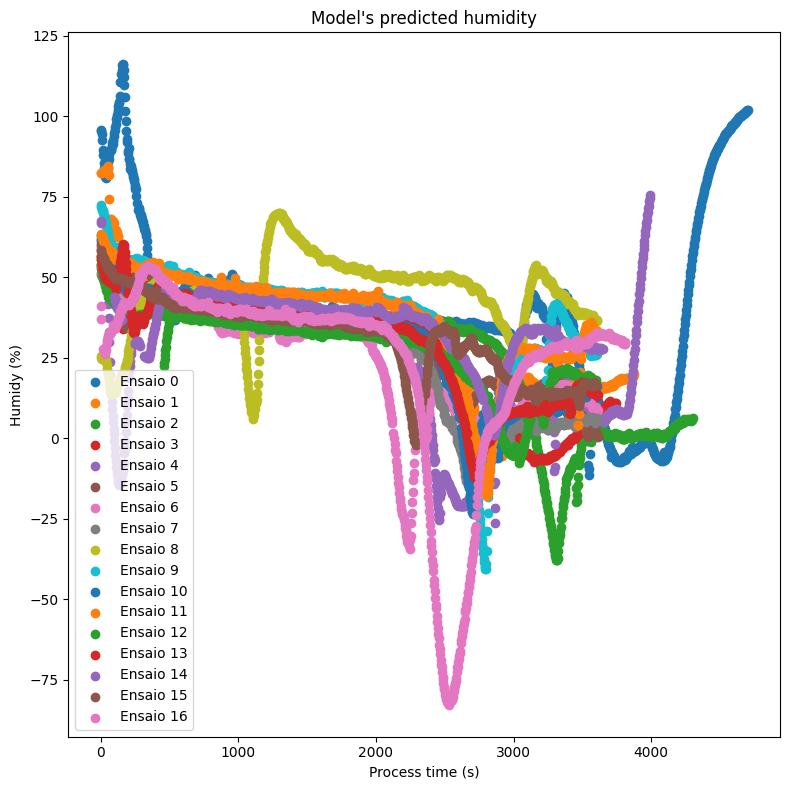

RandomizedSearchCV(cv=17,
                   estimator=TheilSenRegressor(max_iter=1000, n_jobs=-1,
                                               random_state=1),
                   param_distributions={'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'max_subpopulation': [1000.0, 10000.0,
                                                              100000.0],
                                        'tol': [0.0001, 0.001, 0.01]})

In [87]:
from sklearn.linear_model import TheilSenRegressor

base_estimator = TheilSenRegressor(max_iter=1000, random_state=1, n_jobs=-1)
param_grid = {
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'max_subpopulation': [1000.0, 10000.0, 100000.0],
    'tol': [0.0001, 0.001, 0.01]
}

clf = train(base_estimator, param_grid)
persist_instance(clf, base_estimator.__class__.__name__)

#### Lars

In [88]:
from sklearn.linear_model import Lars
Lars().get_params()

{'copy_X': True,
 'eps': 2.220446049250313e-16,
 'fit_intercept': True,
 'fit_path': True,
 'jitter': None,
 'n_nonzero_coefs': 500,
 'normalize': 'deprecated',
 'precompute': 'auto',
 'random_state': None,
 'verbose': False}

Best estimator: Lars(n_nonzero_coefs=1000, random_state=1)
Score: 66.80%


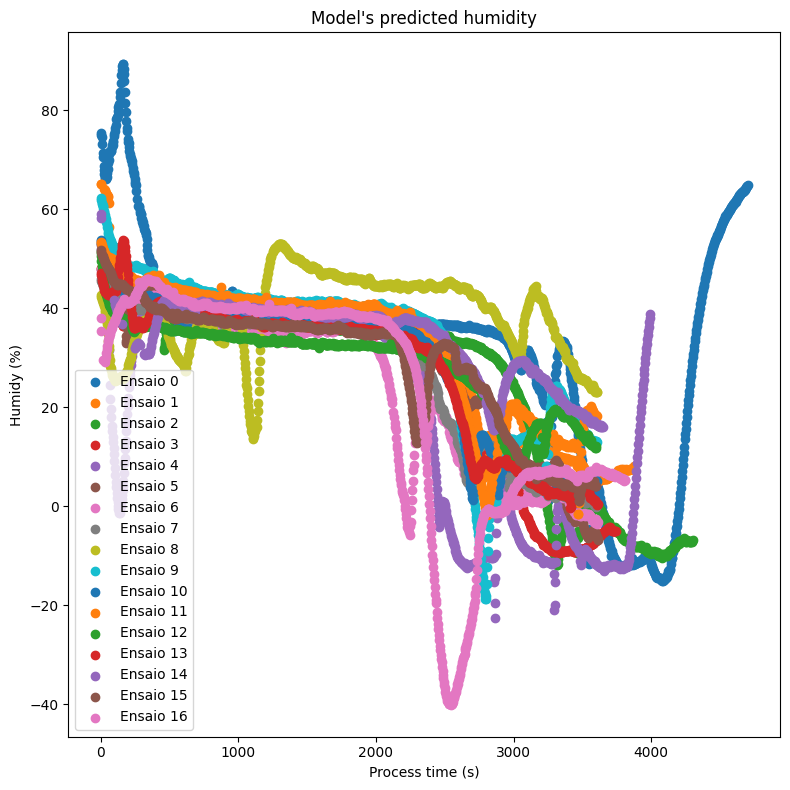

RandomizedSearchCV(cv=17, estimator=Lars(random_state=1),
                   param_distributions={'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'fit_path': [True, False],
                                        'n_nonzero_coefs': [250, 500, 1000]})

In [89]:
from sklearn.linear_model import Lars

base_estimator = Lars(random_state=1)
param_grid = {
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'fit_path': [True, False],
    'n_nonzero_coefs': [250, 500, 1000]
}

clf = train(base_estimator, param_grid)
persist_instance(clf, base_estimator.__class__.__name__)

#### SGDRegressor

In [90]:
from sklearn.linear_model import SGDRegressor
SGDRegressor().get_params()

{'alpha': 0.0001,
 'average': False,
 'early_stopping': False,
 'epsilon': 0.1,
 'eta0': 0.01,
 'fit_intercept': True,
 'l1_ratio': 0.15,
 'learning_rate': 'invscaling',
 'loss': 'squared_error',
 'max_iter': 1000,
 'n_iter_no_change': 5,
 'penalty': 'l2',
 'power_t': 0.25,
 'random_state': None,
 'shuffle': True,
 'tol': 0.001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

c:\Users\rapha\OneDrive\Documentos\GitHub\projects-tcc-imt-2023\.venv-tcc\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
c:\Users\rapha\OneDrive\Documentos\GitHub\projects-tcc-imt-2023\.venv-tcc\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
c:\Users\rapha\OneDrive\Documentos\GitHub\projects-tcc-imt-2023\.venv-tcc\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1548: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
c:\Users\rapha\OneDrive\Documentos\GitHub\projects-tcc-imt-2023\.venv-tcc\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1548: Co

Best estimator: SGDRegressor(alpha=0.001, epsilon=0.01, l1_ratio=0.2,
             loss='squared_epsilon_insensitive', power_t=0.125, random_state=1,
             tol=0.0001, warm_start=True)
Score: 69.25%


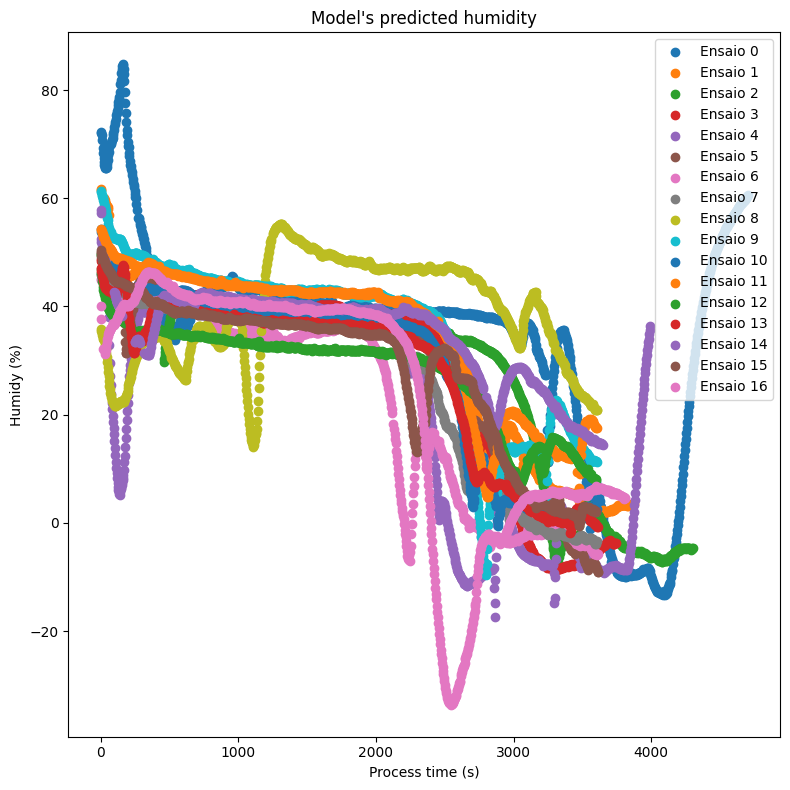

RandomizedSearchCV(cv=17, estimator=SGDRegressor(random_state=1),
                   param_distributions={'alpha': [1e-05, 0.0001, 0.001],
                                        'average': [True, False],
                                        'early_stopping': [True, False],
                                        'epsilon': [0.01, 0.1, 1],
                                        'eta0': [0.001, 0.01, 0.1],
                                        'fit_intercept': [True, False],
                                        'l1_ratio': [0.1, 0.15, 0.2],
                                        'learning_rate': ['constant', 'optimal',
                                                          'invscaling',
                                                          'adaptive'],
                                        'loss': ['squared_error',
                                                 'epsilon_insensitive',
                                                 'squared_epsilon_insensitive',
                                                 'huber'],
                                        'power_t': [0.125, 0.25, 0.5],
                                        'shuffle': [True, False],
                                        'tol': [0.0001, 0.001, 0.01],
                                        'validation_fraction': [0.01, 0.05,
                                                                0.1],
                                        'warm_start': [True, False]})

In [91]:
from sklearn.linear_model import SGDRegressor

base_estimator = SGDRegressor(max_iter=1000, random_state=1)
param_grid = {
    'alpha': [0.00001, 0.0001, 0.001],
    'average': [True, False],
    'early_stopping': [True, False],
    'epsilon': [0.01, 0.1, 1],
    'eta0': [0.001, 0.01, 0.1],
    'fit_intercept': [True, False],
    'l1_ratio': [0.10, 0.15, 0.20],
    'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],
    'loss': ['squared_error', 'epsilon_insensitive', 'squared_epsilon_insensitive', 'huber'],
    'power_t': [0.125, 0.25, 0.50],
    'shuffle': [True, False],
    'tol': [0.0001, 0.001, 0.01],
    'validation_fraction': [0.01, 0.05, 0.1],
    'warm_start': [True, False]
}

clf = train(base_estimator, param_grid)
persist_instance(clf, base_estimator.__class__.__name__)

#### Lasso

In [92]:
from sklearn.linear_model import Lasso
Lasso().get_params()

{'alpha': 1.0,
 'copy_X': True,
 'fit_intercept': True,
 'max_iter': 1000,
 'positive': False,
 'precompute': False,
 'random_state': None,
 'selection': 'cyclic',
 'tol': 0.0001,
 'warm_start': False}

Best estimator: Lasso(positive=True, random_state=1, selection='random', tol=1e-05,
      warm_start=True)
Score: 37.26%


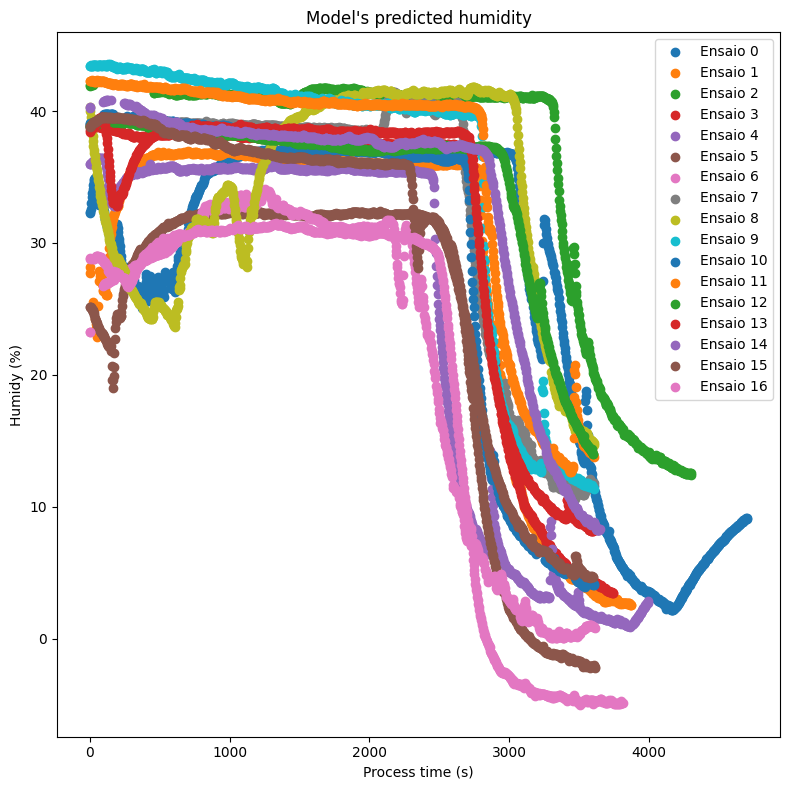

RandomizedSearchCV(cv=17, estimator=Lasso(random_state=1),
                   param_distributions={'alpha': [0.1, 1.0, 10],
                                        'copy_X': [True, False],
                                        'fit_intercept': [True, False],
                                        'positive': [True, False],
                                        'precompute': [True, False],
                                        'selection': ['cyclic', 'random'],
                                        'tol': [1e-05, 0.0001, 0.001],
                                        'warm_start': [True, False]})

In [93]:
from sklearn.linear_model import Lasso

base_estimator = Lasso(max_iter=1000, random_state=1)
param_grid = {
    'alpha': [0.1, 1.0, 10],
    'copy_X': [True, False],
    'fit_intercept': [True, False],
    'positive': [True, False],
    'precompute': [True, False],
    'selection': ['cyclic', 'random'],
    'tol': [0.00001, 0.0001, 0.001],
    'warm_start': [True, False],
}

clf = train(base_estimator, param_grid)
persist_instance(clf, base_estimator.__class__.__name__)